In [1]:
import numpy as np
from sklearn.decomposition import PCA, FactorAnalysis, FastICA
from statsmodels.multivariate.factor_rotation import rotate_factors
import umap

2023-04-15 15:07:41.477557: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX_VNNI
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-15 15:07:41.554727: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


In [2]:
embeddings_256 = np.load('checkpoints/embeddings_256_blur_grayscale.npy')
embeddings_256.shape

(8041, 256)

# Using UMAP on Learned Embeddings

In [3]:
from datasets import StanfordCars
import matplotlib.pyplot as plt

ROOT_DIR = './assets'
stanford_cars_test = StanfordCars(root=ROOT_DIR, split='test', classify_by_year=True)

In [4]:
class_labels = np.array(list(map(lambda x: x[1], stanford_cars_test._samples)))
class_labels.shape

(8041,)

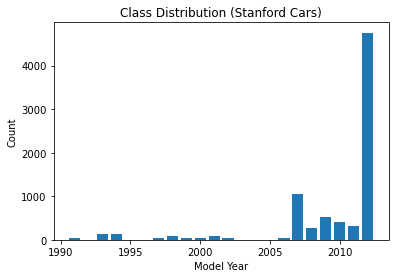

In [15]:
plt.title("Class Distribution (Stanford Cars)")
plt.bar(*np.unique(class_labels, return_counts=True))
plt.xlabel("Model Year")
plt.ylabel("Count")
plt.show()

In [9]:
reducer = umap.UMAP(n_components=2)

umap_embeddings = reducer.fit_transform(embeddings_256)

umap_embeddings.shape

(8041, 2)

In [6]:
np.random.seed(33)

for dim in [1, 2]:
    sorted_indices = np.argsort(umap_embeddings[:, dim - 1])
    q1, q2, q3 = int(0.25 * len(sorted_indices)), int(0.50 * len(sorted_indices)), int(0.75 * len(sorted_indices))

    q1_sample = np.random.choice(sorted_indices[:q1], size=5)
    q2_sample = np.random.choice(sorted_indices[q1:q2], size=5)
    q3_sample = np.random.choice(sorted_indices[q2:q3], size=5)
    q4_sample = np.random.choice(sorted_indices[q3:], size=5)

    for quartile, sample in enumerate([q1_sample, q2_sample, q3_sample, q4_sample]):
        for i, image in enumerate(sample):
            with open(f"./checkpoints/umap_dimension_images_blur_gray/dim_{dim}/q_{quartile + 1}_{i}.jpg", mode='x') as file:
                stanford_cars_test[image][0].save(file)

FileExistsError: [Errno 17] File exists: './checkpoints/umap_dimension_images_blur_gray/dim_1/q_1_0.jpg'

## Using PCA with Varimax Rotation on Learned Embeddings

In [46]:
pca_embeddings = PCA(n_components=2).fit_transform(embeddings_256)
ica_embeddings = FastICA(n_components=2).fit_transform(embeddings_256)
pca_embeddings.shape, ica_embeddings.shape

((8041, 2), (8041, 2))

In [9]:
np.random.seed(33)

for dim in range(1, 5):
    sorted_indices = np.argsort(varimax_embeddings[:, dim - 1])
    q1, q2, q3 = int(0.25 * len(sorted_indices)), int(0.50 * len(sorted_indices)), int(0.75 * len(sorted_indices))

    q1_sample = np.random.choice(sorted_indices[:q1], size=5)
    q2_sample = np.random.choice(sorted_indices[q1:q2], size=5)
    q3_sample = np.random.choice(sorted_indices[q2:q3], size=5)
    q4_sample = np.random.choice(sorted_indices[q3:], size=5)

    for quartile, sample in enumerate([q1_sample, q2_sample, q3_sample, q4_sample]):
        for i, image in enumerate(sample):
            with open(f"./checkpoints/varimax_dimension_images/dim_{dim}/q_{quartile + 1}_{i}.jpg", mode='x') as file:
                stanford_cars_test[image][0].save(file)

## Comparing PCA w. Varimax to UMAP

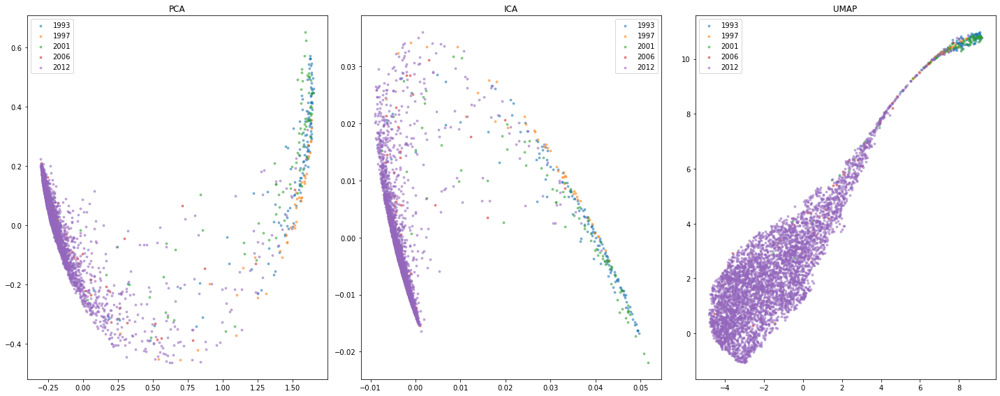

In [147]:
years_to_plot = [1993, 1997, 2001, 2006, 2012]

fig, axs = plt.subplots(1, 3, figsize=(20, 8))
for year in years_to_plot:
    axs[0].set_title("PCA")
    axs[0].scatter(*pca_embeddings[class_labels == year].T, label=str(year), alpha=0.5, s=8)

    axs[1].set_title("ICA")
    axs[1].scatter(*ica_embeddings[class_labels == year].T, label=str(year), alpha=0.5, s=8)

    axs[2].set_title("UMAP")
    axs[2].scatter(*umap_embeddings[class_labels == year].T, label=str(year), alpha=0.5, s=8)

[ax.legend() for ax in axs]
plt.tight_layout()
plt.show()

## Visualize top 10 and bottom 10 images in dimension 1 of UMAP

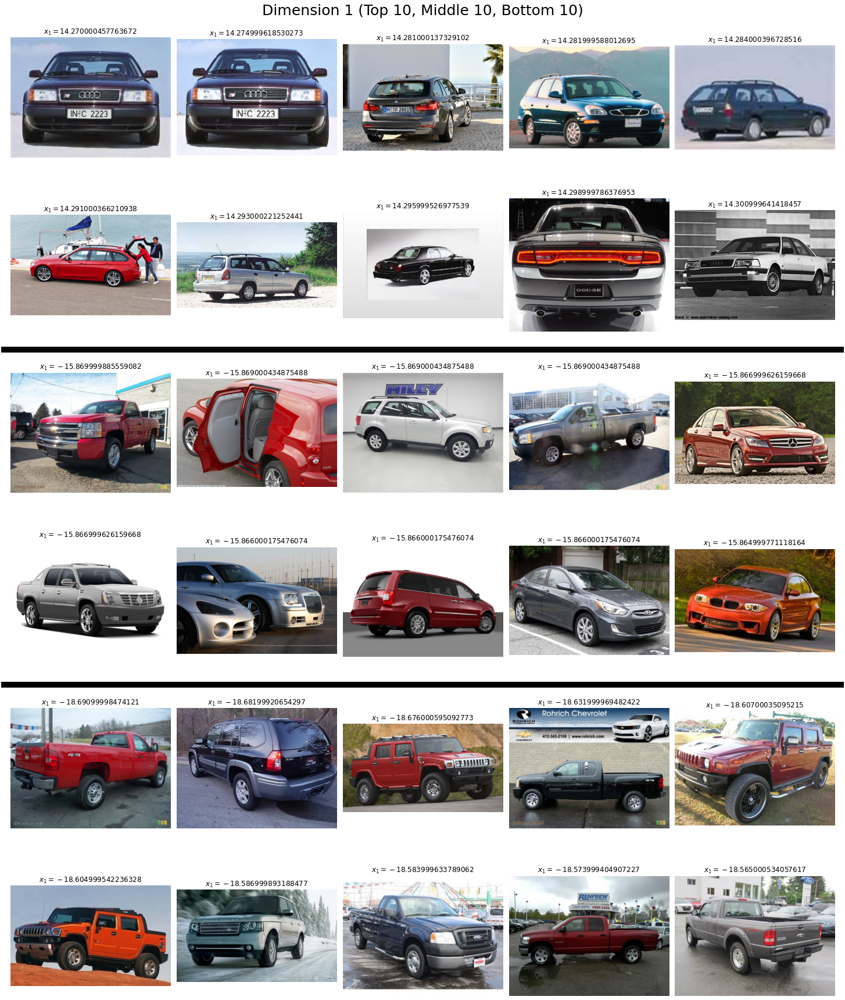

In [10]:
from matplotlib.lines import Line2D

sorted_indices = np.argsort(umap_embeddings[:, 0])
fig, axs = plt.subplots(6, 5, figsize=(20, 25))
fig.suptitle("Dimension 1 (Top 10, Middle 10, Bottom 10)", fontsize=25)

# Top 10
for i, ax in zip(sorted_indices[-10:], axs[:2].ravel()):
    ax.set_title(f"$x_1 = {round(umap_embeddings[i, 0], 3)}$")
    ax.imshow(stanford_cars_test[i][0])
    ax.axis('off')

# Middle 10
midpoint = len(sorted_indices) // 2
for i, ax in zip(sorted_indices[midpoint:midpoint+10], axs[2:4].ravel()):
    ax.set_title(f"$x_1 = {round(umap_embeddings[i, 0], 3)}$")
    ax.imshow(stanford_cars_test[i][0])
    ax.axis('off')


# Bottom 10
for i, ax in zip(sorted_indices[:10], axs[4:].ravel()):
    ax.set_title(f"$x_1 = {round(umap_embeddings[i, 0], 3)}$")
    ax.imshow(stanford_cars_test[i][0])
    ax.axis('off')

# Draw lines in between subdivisions.

transFigure = fig.transFigure.inverted()
line_1 = Line2D((0, 1),(0.65, 0.65), transform=fig.transFigure, linewidth=10, color='black')
line_2 = Line2D((0, 1),(0.33, 0.33), transform=fig.transFigure, linewidth=10, color='black')
fig.lines = line_1, line_2

plt.tight_layout()
plt.show()

## Visualize top 10 and bottom 10 images in dimension 2 of UMAP

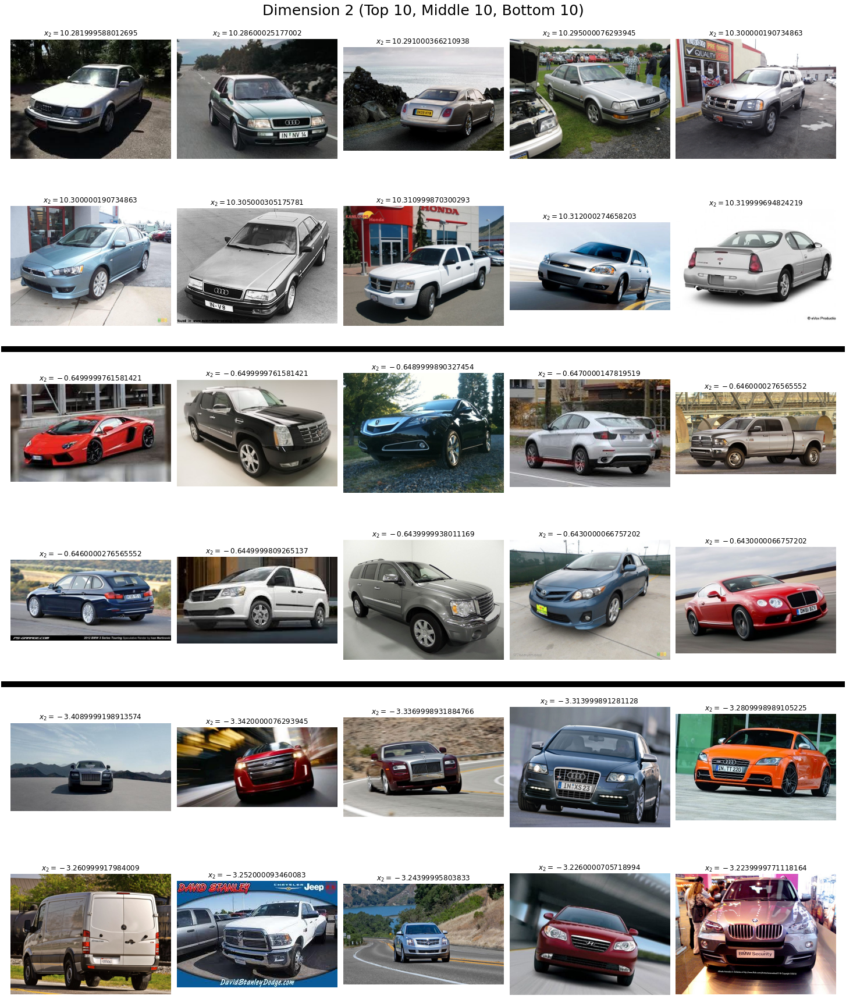

In [11]:
sorted_indices = np.argsort(umap_embeddings[:, 1])
fig, axs = plt.subplots(6, 5, figsize=(20, 25))
fig.suptitle("Dimension 2 (Top 10, Middle 10, Bottom 10)", fontsize=25)

# Top 10
for i, ax in zip(sorted_indices[-10:], axs[:2].ravel()):
    ax.set_title(f"$x_2 = {round(umap_embeddings[i, 1], 3)}$")
    ax.imshow(stanford_cars_test[i][0])
    ax.axis('off')

# Middle 10
midpoint = len(sorted_indices) // 2
for i, ax in zip(sorted_indices[midpoint:midpoint+10], axs[2:4].ravel()):
    ax.set_title(f"$x_2 = {round(umap_embeddings[i, 1], 3)}$")
    ax.imshow(stanford_cars_test[i][0])
    ax.axis('off')


# Bottom 10
for i, ax in zip(sorted_indices[:10], axs[4:].ravel()):
    ax.set_title(f"$x_2 = {round(umap_embeddings[i, 1], 3)}$")
    ax.imshow(stanford_cars_test[i][0])
    ax.axis('off')

# Draw lines in between subdivisions.

transFigure = fig.transFigure.inverted()
line_1 = Line2D((0, 1),(0.65, 0.65), transform=fig.transFigure, linewidth=10, color='black')
line_2 = Line2D((0, 1),(0.33, 0.33), transform=fig.transFigure, linewidth=10, color='black')
fig.lines = line_1, line_2

plt.tight_layout()
plt.show()

## Visualize top 10 and bottom 10 images in dimension 3 of UMAP

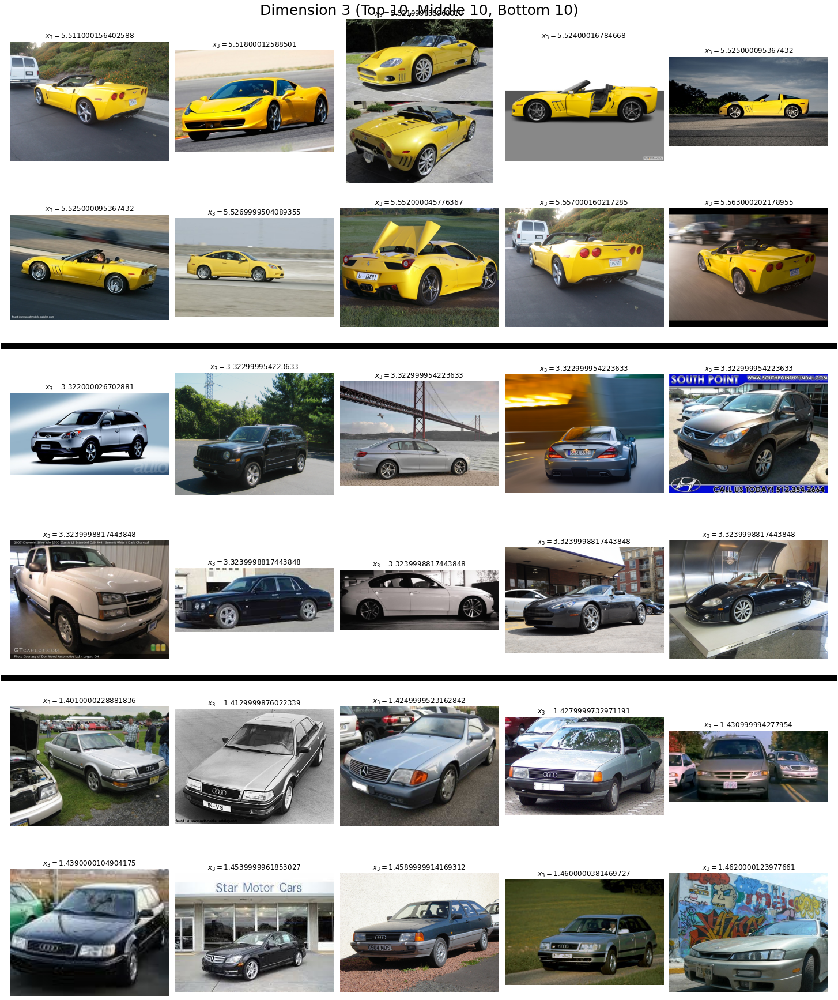

In [163]:
sorted_indices = np.argsort(umap_embeddings[:, 2])
fig, axs = plt.subplots(6, 5, figsize=(20, 25))
fig.suptitle("Dimension 3 (Top 10, Middle 10, Bottom 10)", fontsize=25)

# Top 10
for i, ax in zip(sorted_indices[-10:], axs[:2].ravel()):
    ax.set_title(f"$x_3 = {round(umap_embeddings[i, 2], 3)}$")
    ax.imshow(stanford_cars_test[i][0])
    ax.axis('off')

# Middle 10
midpoint = len(sorted_indices) // 2
for i, ax in zip(sorted_indices[midpoint:midpoint+10], axs[2:4].ravel()):
    ax.set_title(f"$x_3 = {round(umap_embeddings[i, 2], 3)}$")
    ax.imshow(stanford_cars_test[i][0])
    ax.axis('off')


# Bottom 10
for i, ax in zip(sorted_indices[:10], axs[4:].ravel()):
    ax.set_title(f"$x_3 = {round(umap_embeddings[i, 2], 3)}$")
    ax.imshow(stanford_cars_test[i][0])
    ax.axis('off')

# Draw lines in between subdivisions.

transFigure = fig.transFigure.inverted()
line_1 = Line2D((0, 1),(0.65, 0.65), transform=fig.transFigure, linewidth=10, color='black')
line_2 = Line2D((0, 1),(0.33, 0.33), transform=fig.transFigure, linewidth=10, color='black')
fig.lines = line_1, line_2

plt.tight_layout()
plt.show()

In [159]:
class_labels

array([2007, 2012, 2012, ..., 1994, 2012, 2007])